# Генерация датасета

В качестве датасета будем рассматривать прямоугольные области, размеченные классами "камуфляж" и "листва"

# Импорты библиотек

In [ ]:
import os
from os import path
import json

from tqdm.notebook import tqdm
import matplotlib.pyplot as plt

import numpy as np
from sympy import Polygon, Point
from skimage.draw import polygon

# Подключение диска с данными

In [ ]:
drive_mount_dir = '/gdrive'
root_dir = '/gdrive/My Drive/diploma'
data_dir = 'raw_data'
data_root = path.join(root_dir, data_dir)

In [ ]:
from google.colab import drive
drive.mount(drive_mount_dir)

Mounted at /gdrive


# Вспомогательные функции

In [ ]:
TILE_SIZE = 4

In [ ]:
"""
Class that represents polygon that contains data marked with label
"""
class AnnotatedRegion:
  def __init__(self, points_x, points_y, label):
    if len(points_x) != len(points_y):
      raise ValueError("length of points arrays must be equal")
    
    points = []
    for (p_x, p_y) in zip(points_x, points_y):
      points.append((p_x, p_y))
    
    self.polygon = Polygon(*points)
    self.label = label

In [ ]:
"""
Returns list of AnnotatedRegion that represents all regions in picture
"""
def make_regions(regions_arr):
  regions = []

  for region_def in regions_arr:
    region_label = region_def['region_attributes']['type']
    shape = region_def['shape_attributes']
    
    # supports only polygons
    shape_type = shape['name']
    if shape_type != 'polygon':
      raise ValueError('expected shape with type "polygon", but got shape with type {}'.format(shape_type))
    
    points_x = shape['all_points_x']
    points_y = shape['all_points_y']

    regions.append(AnnotatedRegion(points_x, points_y, region_label))

  return regions 

In [ ]:
"""
returns true if tile is inside of any region
if tile is inside or any region also returns it label

Note: this method is only applicable for convex areas, 
because it simply checks that all points of the tile lie inside the area
"""
def check_tile(annotated_regions, x0, y0, w, h):
  p1 = Point(x0, y0)
  p2 = Point(x0 + w, y0)
  p3 = Point(x0, y0 + h)
  p4 = Point(x0 + w, y0 + h)

  for region in annotated_regions:
    poly = region.polygon

    if poly.encloses_point(p1) and poly.encloses_point(p1) and poly.encloses_point(p1) and poly.encloses_point(p1):
      return (True, region.label)
    
  return (False, None)

In [ ]:
def generate_tiles(img, region_defs, tile_size=TILE_SIZE):
  """
  Cuts the img into tile_size squares and labels 
  them based on the areas they are in.

  Returns list of tuples ((tile x0, tile y0), tile label) 
  """
  regions = make_regions(region_defs)

  img_h, img_w, _ = img.shape

  tiles_num_x = img_w // tile_size
  tiles_num_y = img_h // tile_size

  tiles = []

  for i in tqdm(range(tiles_num_x), 'checking tiles'):
    for j in tqdm(range(tiles_num_y)):
      x0 = i * tile_size
      y0 = j * tile_size
      
      ok, label =  check_tile(regions, x0, y0, tile_size, tile_size)

      if ok:
        tiles.append(((x0, y0), label))
  
  return tiles

In [ ]:
"""
Cuts image by specified tiles

Returns tuple of Numpy arrays (slices, labels)
Note: labels - Numpy array of strings
"""
def cut_image_by_tiles(img, tiles, tile_size=TILE_SIZE):
  image_slices = []
  image_labels = []

  for ((x0, y0), label) in tiles:
    image_part = img[y0:y0 + tile_size, x0:x0 + tile_size,:]
    image_slices.append(image_part)
    image_labels.append(label)

  return (np.stack(image_slices), np.stack(image_labels))

# Генерируем тайлы для цветного (rgb) изображения

In [ ]:
img_color_dir = path.join(root_dir, 'consolidated', 'color', 'rgb.png')
# labels in VGG annotation format
labels_color_dir = path.join(root_dir, 'consolidated', 'color', 'regions_for_bin_class_foliage_other.json')

In [ ]:
img_color = plt.imread(img_color_dir)

with open(labels_color_dir, "r") as labels_file:
  raw_regions_color = json.load(labels_file)

In [ ]:
img_color.shape

(1200, 1920, 3)

In [ ]:
labels_obj_name = '470_acA1920-50gc_1595683292.png3353587'
regions_color = raw_regions_color[labels_obj_name]['regions']
regions_color

[{'region_attributes': {'type': 'camouflage'},
  'shape_attributes': {'all_points_x': [252, 0, 2, 74, 93, 11, 83, 213],
   'all_points_y': [382, 382, 454, 570, 585, 695, 782, 793],
   'name': 'polygon'}},
 {'region_attributes': {'type': 'camouflage'},
  'shape_attributes': {'all_points_x': [436,
    307,
    334,
    374,
    375,
    408,
    499,
    591,
    584,
    531,
    476],
   'all_points_y': [372, 374, 455, 457, 594, 771, 798, 572, 315, 275, 313],
   'name': 'polygon'}},
 {'region_attributes': {'type': 'camouflage'},
  'shape_attributes': {'all_points_x': [1568, 1367, 1408, 1471, 1469, 1522],
   'all_points_y': [348, 359, 549, 505, 443, 430],
   'name': 'polygon'}},
 {'region_attributes': {'type': 'foliage'},
  'shape_attributes': {'all_points_x': [771,
    822,
    782,
    651,
    637,
    812,
    979,
    1002,
    1094,
    1088,
    983,
    946,
    968,
    987,
    1415,
    1457,
    1393,
    766],
   'all_points_y': [800,
    789,
    708,
    647,
    501,
   

посмотрим как будет выглядеть сетка на картинке

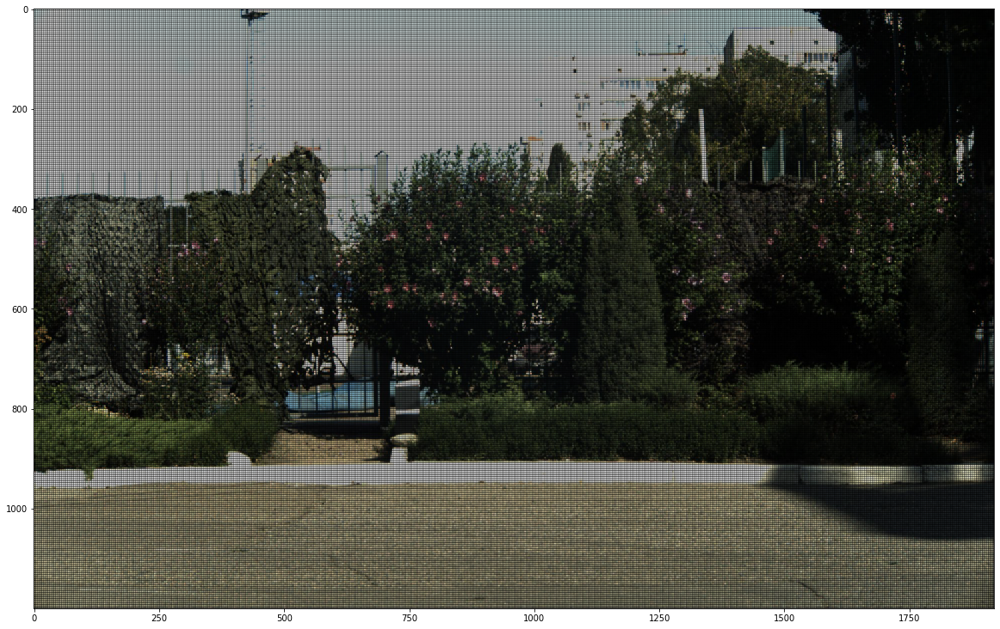

In [ ]:
img_with_grid = np.copy(img_color)
# Modify the image to include the grid
grid_color = [0, 0, 0]
img_with_grid[:,::TILE_SIZE,:] = grid_color
img_with_grid[::TILE_SIZE,:,:] = grid_color

plt.figure(figsize=(20, 20))
plt.imshow(img_with_grid)

# Генерируем тайлы для мультиспектра

In [ ]:
img_multispectral_dir = path.join(root_dir, 'consolidated', 'multi', '470.png')
# labels in VGG annotation format
labels_multispectral_dir = path.join(root_dir, 'consolidated', 'multi', 'regions.json')

In [ ]:
img_multispectral = plt.imread(img_multispectral_dir)

with open(labels_multispectral_dir, "r") as labels_file:
  raw_regions_multispectral = json.load(labels_file)

In [ ]:
labels_obj_name_multispectral = '470.png1166818'
regions_multispectral = raw_regions_multispectral[labels_obj_name_multispectral]['regions']
regions_multispectral

[{'region_attributes': {'type': 'camouflage'},
  'shape_attributes': {'all_points_x': [185,
    308,
    352,
    403,
    456,
    472,
    359,
    360,
    282,
    252],
   'all_points_y': [403, 403, 343, 315, 342, 738, 744, 820, 819, 523],
   'name': 'polygon'}},
 {'region_attributes': {'type': 'foliage'},
  'shape_attributes': {'all_points_x': [1, 219, 147, 3],
   'all_points_y': [842, 863, 942, 944],
   'name': 'polygon'}},
 {'region_attributes': {'type': 'foliage'},
  'shape_attributes': {'all_points_x': [279, 360, 310, 256, 252, 161],
   'all_points_y': [824, 836, 932, 915, 942, 941],
   'name': 'polygon'}},
 {'region_attributes': {'type': 'foliage'},
  'shape_attributes': {'all_points_x': [207, 211, 63, 63, 85, 87],
   'all_points_y': [746, 846, 837, 808, 799, 757],
   'name': 'polygon'}},
 {'region_attributes': {'type': 'camouflage'},
  'shape_attributes': {'all_points_x': [132, 136, 95, 61, 3, 2],
   'all_points_y': [407, 509, 746, 801, 811, 400],
   'name': 'polygon'}},
 {

# Построение тайлов через маску областей

In [ ]:
def generate_masks(region_defs, mask_shape):
  """
  Returns list of tuples (mask, region_label)
  """
  masks = []

  for region in region_defs:
    region_label = region['region_attributes']['type']
    shape = region['shape_attributes']
    
    # supports only polygons
    shape_type = shape['name']
    if shape_type != 'polygon':
      raise ValueError('expected shape with type "polygon", but got shape with type {}'.format(shape_type))
    
    points_x = shape['all_points_x']
    points_y = shape['all_points_y']

    mask = np.zeros(mask_shape, dtype=np.uint8)
    rr, cc = polygon(points_y, points_x)

    mask[rr, cc] = 1

    masks.append((mask, region_label))
  
  return masks

In [ ]:
def group_masks_by_label(masks):
  """
  Groups all masks with the same label into one
  """
  different_masks = {}

  for (mask, label) in masks:
    if label in different_masks:
      different_masks[label] = np.logical_or(different_masks[label], mask)
    else:
      different_masks[label] = mask
  
  return different_masks

In [ ]:
def combine_masks(masks, labels_map):
  """
  Combines all masks into one that contains all regions
  """
  combined = None

  for (label, mask) in masks.items():
    mask_layer = labels_map[label] * mask

    if combined is None:
      combined = mask_layer
    else:
      combined += mask_layer
  
  return combined

In [ ]:
def create_labels_map(labels, initial_value=1, mult=10):
  """
  Creates map where keys - labels of dataset, values - area value in combined mask
  """
  labels_map = {}

  val = initial_value
  for l in labels:
    labels_map[l] = val
    val *= mult
  
  return labels_map

In [ ]:
def choose_tile_label(tile, labels_map, threshold=0.95):
  """
  Picks an appropriate label for tile based on its values
  """
  tile_pixels_count = tile.size

  for (label, val) in labels_map.items():
    masked_pixels_count = np.count_nonzero(tile == val)

    if masked_pixels_count / tile_pixels_count > threshold:
      return label

In [ ]:
def gen_tiles_by_mask(region_defs, img_size, tile_size=TILE_SIZE, tile_overlap_threshold=0.8):
  """
  Performs check for all tiles of the grid
  """
  masks = generate_masks(region_defs, img_size)

  grouped_masks = group_masks_by_label(masks)
  labels_map = create_labels_map(grouped_masks.keys())

  combined_mask = (combine_masks(grouped_masks, labels_map) > 0) * 1000 + 100
  labels_map = { 'other': 100, 'foliage': 1100}
  
  img_h, img_w = img_size

  tiles_num_x = img_w // tile_size
  tiles_num_y = img_h // tile_size

  tiles = []

  tile_pixels_count = tile_size ** 2

  for i in tqdm(range(tiles_num_x), 'checking tiles'):
    for j in tqdm(range(tiles_num_y)):
      x0 = i * tile_size
      y0 = j * tile_size

      masked_tile = combined_mask[y0:y0 + tile_size, x0:x0 + tile_size]
      masked_pixels_count = np.count_nonzero(masked_tile)

      if masked_pixels_count / tile_pixels_count < tile_overlap_threshold:
        continue
      
      label = choose_tile_label(masked_tile, labels_map, tile_overlap_threshold)
      
      if label:
        tiles.append(((x0, y0), label))
  
  return tiles

## RGB

In [ ]:
img_color_dir = path.join(root_dir, 'consolidated', 'color', 'rgb.png')
# labels in VGG annotation format
labels_color_dir = path.join(root_dir, 'consolidated', 'color', 'regions_for_bin_class_foliage_other.json')

In [ ]:
img_color = plt.imread(img_color_dir)

with open(labels_color_dir, "r") as labels_file:
  raw_regions_color = json.load(labels_file)

In [ ]:
img_color.shape

(1200, 1920, 3)

In [ ]:
labels_obj_name = '470_acA1920-50gc_1595683292.png3353587'
regions_color = raw_regions_color[labels_obj_name]['regions']
regions_color

[{'region_attributes': {'type': 'camouflage'},
  'shape_attributes': {'all_points_x': [252, 0, 2, 74, 93, 11, 83, 213],
   'all_points_y': [382, 382, 454, 570, 585, 695, 782, 793],
   'name': 'polygon'}},
 {'region_attributes': {'type': 'camouflage'},
  'shape_attributes': {'all_points_x': [436,
    307,
    334,
    374,
    375,
    408,
    499,
    591,
    584,
    531,
    476],
   'all_points_y': [372, 374, 455, 457, 594, 771, 798, 572, 315, 275, 313],
   'name': 'polygon'}},
 {'region_attributes': {'type': 'camouflage'},
  'shape_attributes': {'all_points_x': [1568, 1367, 1408, 1471, 1469, 1522],
   'all_points_y': [348, 359, 549, 505, 443, 430],
   'name': 'polygon'}},
 {'region_attributes': {'type': 'foliage'},
  'shape_attributes': {'all_points_x': [771,
    822,
    782,
    651,
    637,
    812,
    979,
    1002,
    1094,
    1088,
    983,
    946,
    968,
    987,
    1415,
    1457,
    1393,
    766],
   'all_points_y': [800,
    789,
    708,
    647,
    501,
   

In [ ]:
mask_size_color = img_color.shape[:2]
tiles_color = gen_tiles_by_mask(regions_color, mask_size_color)

In [ ]:
len(list(filter(lambda t: t[1] == 'foliage', tiles_color)))

49726

In [ ]:
X_color, Y_color = cut_image_by_tiles(img_color, tiles_color)

In [ ]:
np.save(path.join(root_dir, 'tiles_data_foliage_other', 'data_color_{}'.format(TILE_SIZE)), X_color)
np.save(path.join(root_dir, 'tiles_data_foliage_other', 'labels_color_{}'.format(TILE_SIZE)), Y_color)

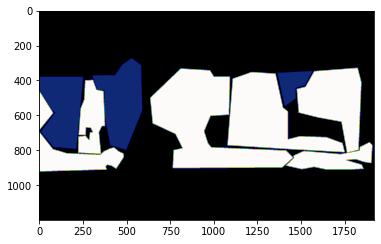

In [ ]:
masks = generate_masks(regions_color, mask_size_color)
grouped_masks = group_masks_by_label(masks)
labels_map = create_labels_map(grouped_masks.keys())

combined_mask = combine_masks(grouped_masks, labels_map)

plt.imshow(combined_mask, cmap=plt.cm.gist_earth)

## Multispectral

In [ ]:
img_multispectral_dir = path.join(root_dir, 'consolidated', 'multi', '470.png')
# labels in VGG annotation format
labels_multispectral_dir = path.join(root_dir, 'consolidated', 'multi', 'regions_for_bin_class_foliage_other.json')

In [ ]:
img_multispectral = plt.imread(img_multispectral_dir)

with open(labels_multispectral_dir, "r") as labels_file:
  raw_regions_multispectral = json.load(labels_file)

In [ ]:
labels_obj_name_multispectral = '470.png1166818'
regions_multispectral = raw_regions_multispectral[labels_obj_name_multispectral]['regions']
regions_multispectral

[{'region_attributes': {'type': 'camouflage'},
  'shape_attributes': {'all_points_x': [185,
    308,
    352,
    403,
    456,
    472,
    359,
    360,
    282,
    252],
   'all_points_y': [403, 403, 343, 315, 342, 738, 744, 820, 819, 523],
   'name': 'polygon'}},
 {'region_attributes': {'type': 'foliage'},
  'shape_attributes': {'all_points_x': [1, 219, 147, 3],
   'all_points_y': [842, 863, 942, 944],
   'name': 'polygon'}},
 {'region_attributes': {'type': 'foliage'},
  'shape_attributes': {'all_points_x': [279, 360, 310, 256, 252, 161],
   'all_points_y': [824, 836, 932, 915, 942, 941],
   'name': 'polygon'}},
 {'region_attributes': {'type': 'foliage'},
  'shape_attributes': {'all_points_x': [207, 211, 63, 63, 85, 87],
   'all_points_y': [746, 846, 837, 808, 799, 757],
   'name': 'polygon'}},
 {'region_attributes': {'type': 'camouflage'},
  'shape_attributes': {'all_points_x': [132, 136, 95, 61, 3, 2],
   'all_points_y': [407, 509, 746, 801, 811, 400],
   'name': 'polygon'}},
 {

In [ ]:
mask_size_multispectral = img_multispectral.shape[:2]
tiles_multispectral = gen_tiles_by_mask(regions_multispectral, mask_size_multispectral)

In [ ]:
# читаем все картинки и нарезаем их
images_multispectral = ['470', '540', '635', '735', '880']
img_ext = 'png'

In [ ]:
for img_name in images_multispectral:
  img_path = path.join(root_dir, 'consolidated', 'multi', '{}.{}'.format(img_name, img_ext))

  img_multi = plt.imread(img_path)
  x_tiles, y_labels = cut_image_by_tiles(img_multi, tiles_multispectral)
  
  np.save(path.join(root_dir, 'tiles_data_foliage_other', 'data_multi_{}_{}'.format(img_name, TILE_SIZE)), x_tiles)
  np.save(path.join(root_dir, 'tiles_data_foliage_other', 'labels_multi_{}_{}'.format(img_name, TILE_SIZE)), y_labels)

In [ ]:
len(tiles_multispectral)

124905